In [1]:
%load_ext autoreload
%autoreload 2

from seg_utils import load_sam, segment,show_mask,show_points
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import numpy as np
import matplotlib
import torch
import cv2
from matplotlib.patches import ConnectionPatch

import torch
import torchvision.transforms as transforms
from sklearn.decomposition import PCA
from pytorch_lightning import seed_everything
from PIL import Image

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [70]:
class Dinov2Matcher:

  def __init__(self, repo_name="facebookresearch/dinov2", model_name="dinov2_vitb14", img_input_size=448, device="cuda"):
    self.repo_name = repo_name
    self.model_name = model_name
    self.smaller_edge_size = img_input_size
    self.device = device
    self.model = torch.hub.load(repo_or_dir=repo_name, model=model_name).to(self.device)
    self.model.eval()
    print(img_input_size)

    self.transform = transforms.Compose([
        transforms.Resize(size=img_input_size, interpolation=transforms.InterpolationMode.BICUBIC, antialias=True),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)), # imagenet defaults
      ])

  # https://github.com/facebookresearch/dinov2/blob/255861375864acdd830f99fdae3d9db65623dafe/notebooks/features.ipynb
  def prepare_image(self, rgb_image_numpy):
    image = Image.fromarray(rgb_image_numpy)
    #print(rgb_image_numpy.shape)
    image_tensor = self.transform(image)
    #print(image_tensor.shape)
    resize_scale = image.width / image_tensor.shape[2]

    # Crop image to dimensions that are a multiple of the patch size
    height, width = image_tensor.shape[1:] # C x H x W
    cropped_width, cropped_height = width - width % self.model.patch_size, height - height % self.model.patch_size # crop a bit from right and bottom parts
    image_tensor = image_tensor[:, :cropped_height, :cropped_width]

    grid_size = (cropped_height // self.model.patch_size, cropped_width // self.model.patch_size)
    return image_tensor, grid_size, resize_scale
  
  def prepare_mask(self, mask_image_numpy, grid_size, resize_scale):
    cropped_mask_image_numpy = mask_image_numpy[:int(grid_size[0]*self.model.patch_size*resize_scale), :int(grid_size[1]*self.model.patch_size*resize_scale)]
    image = Image.fromarray(cropped_mask_image_numpy)
    resized_mask = image.resize((grid_size[1], grid_size[0]), resample=Image.Resampling.NEAREST)
    resized_mask = np.asarray(resized_mask).flatten()
    return resized_mask
  
  def extract_features(self, image_tensor):
    with torch.inference_mode():
      image_batch = image_tensor.unsqueeze(0).to(self.device)
      tokens = self.model.get_intermediate_layers(image_batch)[0].squeeze()
    return tokens.cpu().numpy()
  
  def idx_to_source_position(self, idx, grid_size, resize_scale):
    row = (idx // grid_size[1])*self.model.patch_size*resize_scale + self.model.patch_size / 2
    col = (idx % grid_size[1])*self.model.patch_size*resize_scale + self.model.patch_size / 2
    return row, col
  
  def get_embedding_visualization(self, tokens, grid_size, resized_mask=None):
    seed_everything(0)
    pca = PCA(n_components=3)
    
    if resized_mask is not None:
      print(tokens.shape)
      tokens = tokens[resized_mask]
      print(tokens.shape)

    reduced_tokens = pca.fit_transform(tokens.astype(np.float32))

    if resized_mask is not None:
      tmp_tokens = np.zeros((*resized_mask.shape, 3), dtype=reduced_tokens.dtype)
      tmp_tokens[resized_mask] = reduced_tokens
      reduced_tokens = tmp_tokens

    reduced_tokens = reduced_tokens.reshape((*grid_size, -1))
    normalized_tokens = (reduced_tokens-np.min(reduced_tokens))/(np.max(reduced_tokens)-np.min(reduced_tokens))
    return normalized_tokens
  

  def visualize_cosine_values(tokens, grid_size):
    tokens = tokens.reshape((*grid_size, -1))
    normalized_tokens = (tokens-np.min(tokens))/(np.max(tokens)-np.min(tokens))
    return normalized_tokens


In [73]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
img_input_resize_size = 672

dm = Dinov2Matcher(device=device, repo_name="facebookresearch/dinov2", model_name="dinov2_vitb14", img_input_size=img_input_resize_size)

Using cache found in /home/rthomp12/.cache/torch/hub/facebookresearch_dinov2_main
INFO - 2024-12-30 14:39:28,880 - vision_transformer - using MLP layer as FFN


672


In [11]:
demo_img_path = "exp_manip_images/teapot_1_c2_Color.png"
test_img_path =  "exp_manip_images/teapot_1_c1_Color.png"


demo_img = cv2.cvtColor(cv2.imread(demo_img_path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
test_img = cv2.cvtColor(cv2.imread(test_img_path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)

all_part_names = ["cup", "handle"]

part_points = {part:[] for part in all_part_names}
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'purple']
color = 'red'
points = part_points[all_part_names[0]]
from ipywidgets import widgets 

def on_click(event):
    global color, cup_points, handle_points, points
    ix, iy = int(event.xdata), int(event.ydata)
    print(f"Coordinates: x={ix}, y={iy}")
    points.append([ix, iy])

    # Plot an 'X' marker at the clicked coordinates
    ax.plot(ix, iy, marker='x', markersize=10, color=color, zorder=2)
    fig.canvas.draw()  # Update the figure to show the new marker

def plot_map_with_points(map_array):
    global fig, ax, textbox
    
    
    buttons = widgets.RadioButtons(
        options=all_part_names,
        disabled=False
    )
    
    display(buttons)

    def radio(value):
        global color, colors, part_points, points
        color = colors[all_part_names.index(value['new'])]
        points = part_points[value['new']]
        
    buttons.observe(radio, names = 'value')
        
    
    fig, ax = plt.subplots(figsize=(10, 10))
    cmap = matplotlib.colors.ListedColormap(['black', 'white'])
#     textbox = matplotlib.widgets.TextBox(ax, 'temp',)


    ax.imshow(map_array, cmap=cmap,zorder=1)

    #plt.legend()
    plt.show()

    # Connect the click event
    cid = fig.canvas.mpl_connect('button_press_event', on_click)

RadioButtons(options=('cup', 'handle'), value='cup')

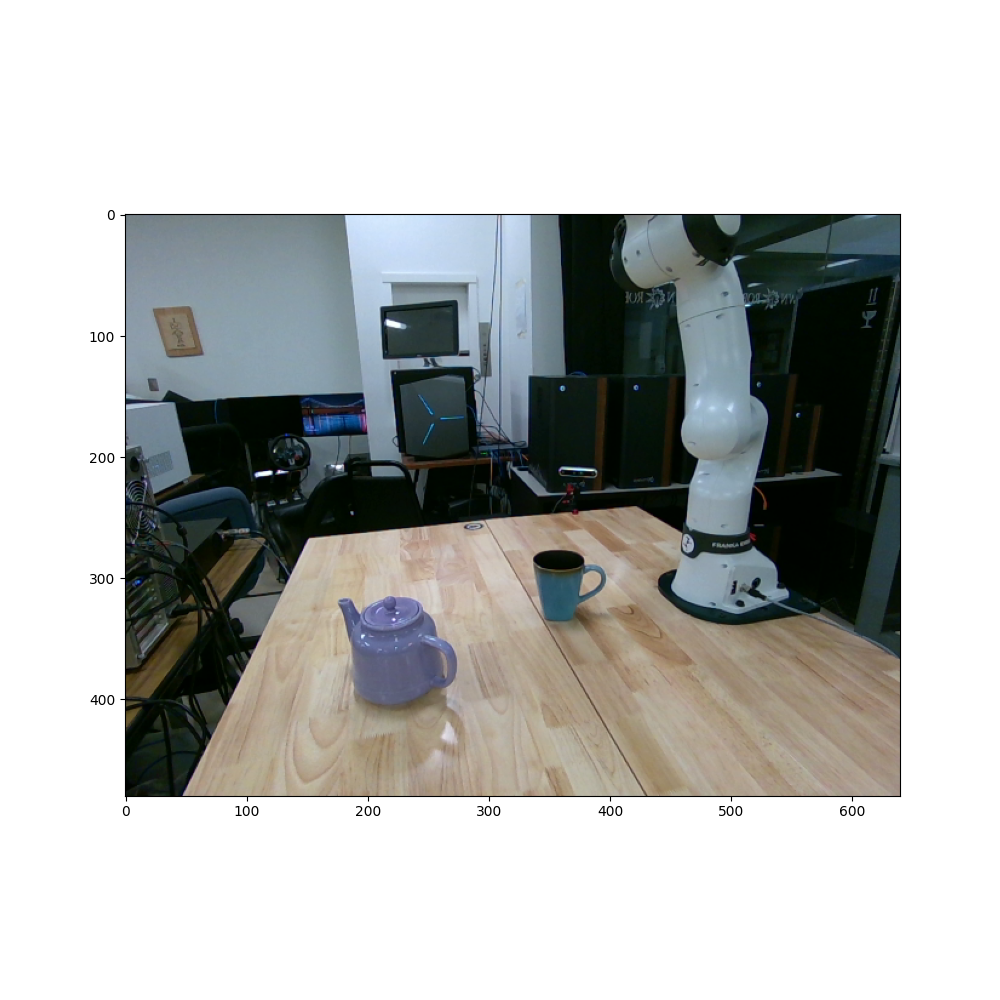

In [12]:
%matplotlib widget
plot_map_with_points(demo_img)

In [13]:
mask_points, mask_labels, mask_masks, mask_scores, sam_embeddings = {},{},{},{},{}

for part in all_part_names:
#     print(part)
#     print(part_points[part])
    mask_points[part] = np.array(part_points[part])
    mask_labels[part] = np.ones(mask_points[part].shape[0], dtype=int)

for masked_part in all_part_names:
    seg_points = []
    seg_labels = []
    seg_points += list(mask_points[masked_part])
    seg_labels += list(mask_labels[masked_part])
    for other_part in all_part_names:
        if masked_part == other_part:
            continue
        seg_points += list(mask_points[other_part])
        seg_labels += list(np.zeros(mask_points[other_part].shape[0], dtype=int))
    mask_masks[masked_part], mask_scores[masked_part], sam_embeddings[masked_part] = segment(sam_predictor, demo_img, np.array(seg_points), np.array(seg_labels), multimask_flag=False)

In [14]:
plt.close() #close previous plots
%matplotlib inline

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


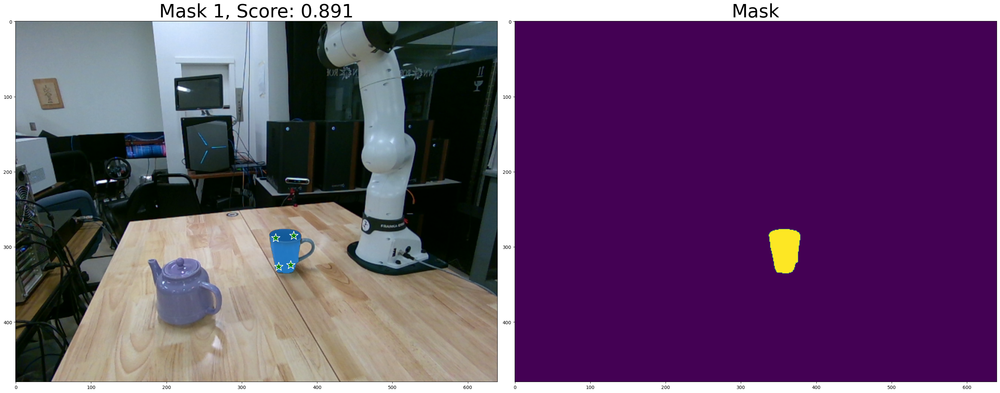

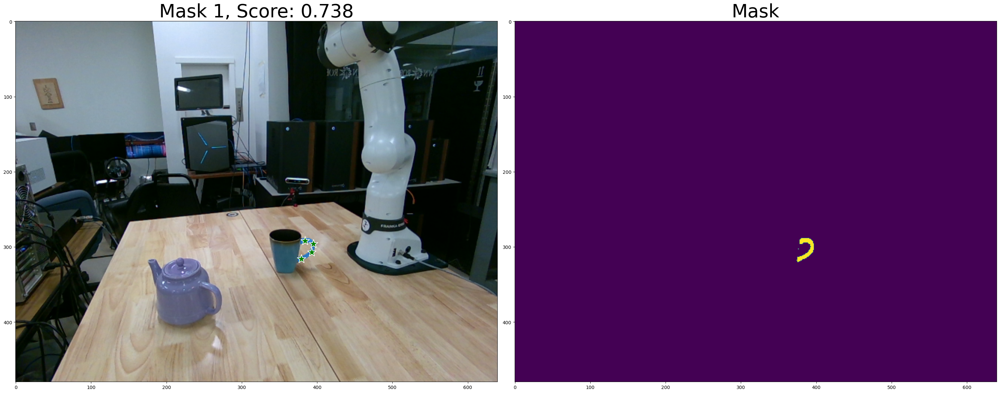

In [39]:
for part in all_part_names:
    for j, (mask, score) in enumerate(zip(mask_masks[part], mask_scores[part])):
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30,40))
        # plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        ax1.imshow(demo_img)
        ax1.title.set_text(f"Mask {j+1}, Score: {score:.3f}")
        ax1.title.set_fontsize(40) 
        show_mask(mask, ax1)
        show_points(mask_points[part], mask_labels[part], ax1)
        demo_img_mask = mask_masks[part][0]
        print(demo_img_mask)
        ax2.imshow(demo_img_mask)
        ax2.title.set_text("Mask")
        ax2.title.set_fontsize(40) 
        fig.tight_layout()

INFO - 2024-12-30 14:52:55,288 - seed - Seed set to 0
INFO - 2024-12-30 14:52:55,303 - seed - Seed set to 0
INFO - 2024-12-30 14:52:55,382 - seed - Seed set to 0
INFO - 2024-12-30 14:52:55,460 - seed - Seed set to 0
INFO - 2024-12-30 14:52:55,476 - seed - Seed set to 0


torch.Size([3, 672, 896])
(3072, 768)
(20, 768)
torch.Size([3, 672, 896])
(3072, 768)
(4, 768)


INFO - 2024-12-30 14:52:55,534 - seed - Seed set to 0


demo_image.shape: (480, 640, 3)
demo_mask.shape: (480, 640)
demo_image_tensor.shape: torch.Size([3, 672, 896])
grid_size: (48, 64)
resize_scale: 0.7142857142857143


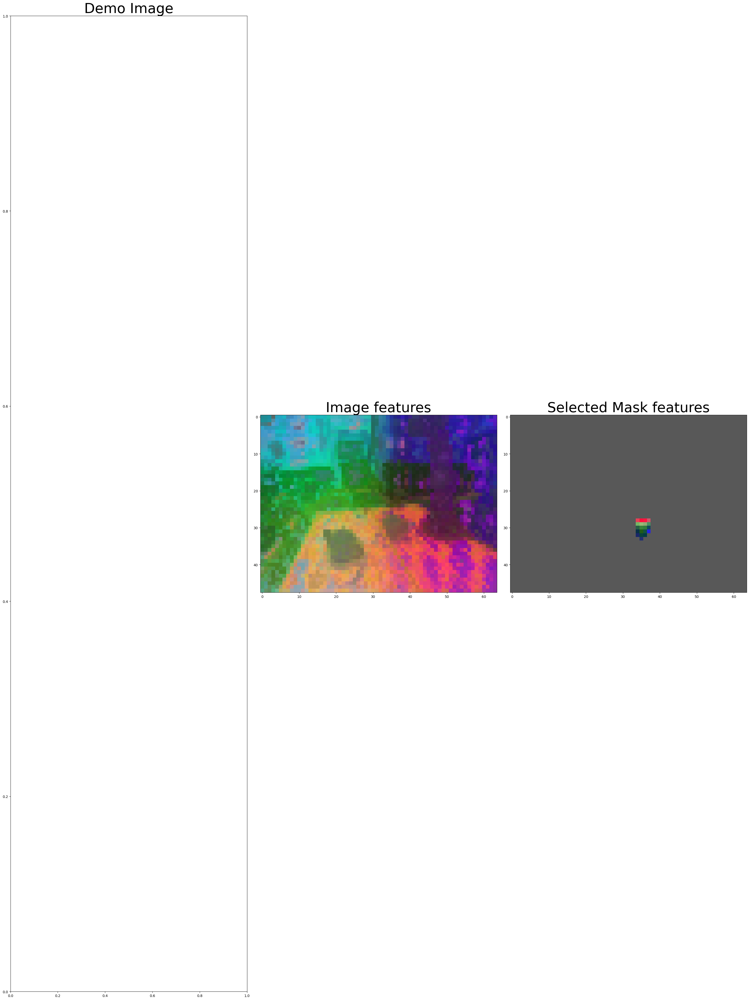

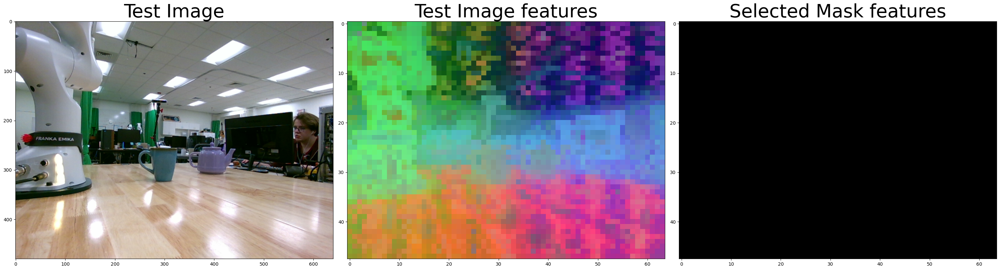

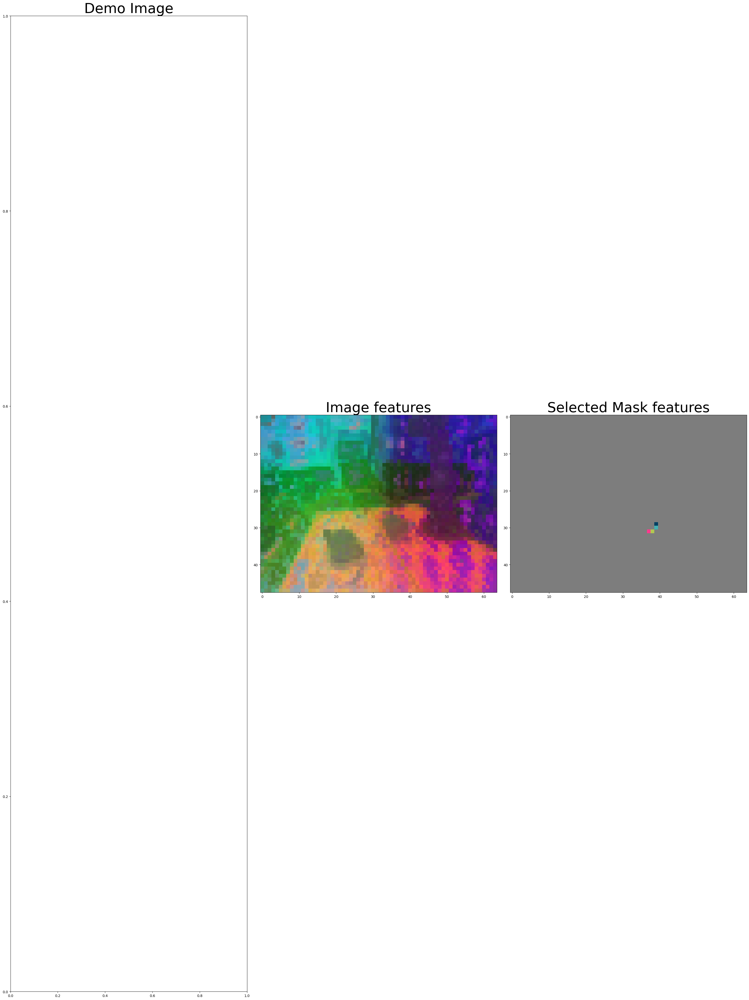

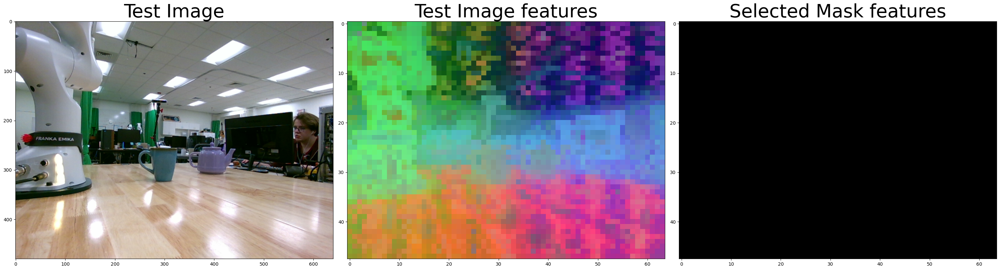

In [84]:
# Extract features
demo_image_tensor, demo_image_grid_size, demo_image_resize_scale = dm.prepare_image(demo_img)
demo_image_features = dm.extract_features(demo_image_tensor)

# Extract test features
test_image_tensor, test_image_grid_size, test_image_resize_scale = dm.prepare_image(test_img)
test_image_features = dm.extract_features(test_image_tensor)

resized_demo_masks = {}

for part in ['cup', 'handle']:
    # Visualization
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,40))
    print(demo_image_tensor.shape)
    ax1.title.set_text("Demo Image")
    ax1.title.set_fontsize(40) 
    resized_demo_masks[part] = dm.prepare_mask(mask_masks[part][0], demo_image_grid_size, demo_image_resize_scale)
    image_feat_viz = dm.get_embedding_visualization(demo_image_features, demo_image_grid_size)
    mask_feat_viz = dm.get_embedding_visualization(demo_image_features, demo_image_grid_size, resized_demo_masks[part])
    ax2.imshow(image_feat_viz)
    ax2.title.set_text("Image features")
    ax2.title.set_fontsize(40) 
    ax3.imshow(mask_feat_viz)
    ax3.title.set_text("Selected Mask features")
    ax3.title.set_fontsize(40) 
    fig.tight_layout()

    #visualize the test image and the extracted features
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,40))
    ax1.imshow(test_img)
    ax1.title.set_text("Test Image")
    ax1.title.set_fontsize(40)
    test_image_feat_viz = dm.get_embedding_visualization(test_image_features, test_image_grid_size)
    ax2.imshow(test_image_feat_viz)
    ax2.title.set_text("Test Image features")
    ax2.title.set_fontsize(40)
    ax3.imshow(np.zeros_like(test_image_feat_viz))
    ax3.title.set_text("Selected Mask features")
    ax3.title.set_fontsize(40) 
    fig.tight_layout()


# More info
print("demo_image.shape:", demo_img.shape)
print("demo_mask.shape:", demo_img_mask.shape)
print("demo_image_tensor.shape:", demo_image_tensor.shape)
print("grid_size:", demo_image_grid_size)
print("resize_scale:", demo_image_resize_scale)

(array([1826, 1827, 1828, 1829, 1890, 1891, 1892, 1893, 1954, 1955, 1956,
       1957, 2018, 2019, 2020, 2021, 2082, 2083, 2084, 2147]),)


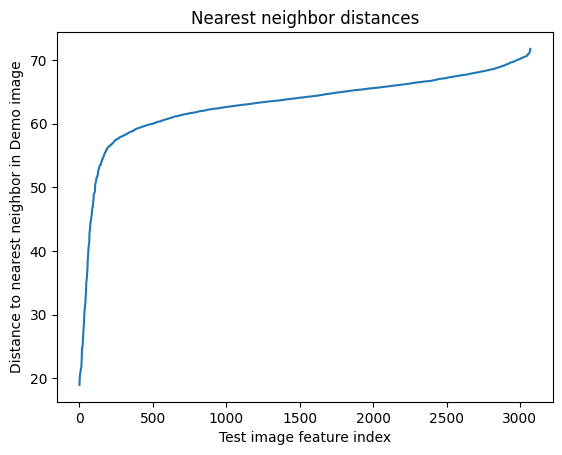

(array([1895, 1959, 2021, 2022]),)


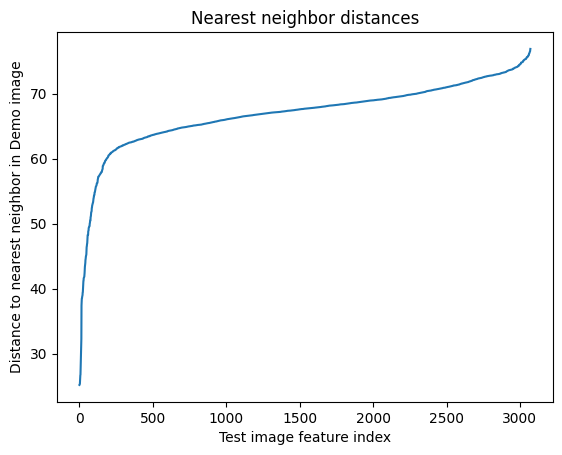

In [91]:
distances = {}
match2to1 = {}
for part in ['cup', 'handle']:
    # Build knn using features from demo image, and query all features from test image
    knn = NearestNeighbors(n_neighbors=1)  #find nearest 1 neighbour 
    knn.fit(demo_image_features[resized_demo_masks[part]])
    distances[part], match2to1[part] = knn.kneighbors(test_image_features) #find neighbour for each demo feature in test image and the distance
    match2to1[part] = np.array(match2to1[part])  # match2to1 is the index of the closest feature in demo_image for each feature in test_image

    plt.plot(sorted(distances[part]))
    plt.xlabel('Test image feature index')
    plt.ylabel('Distance to nearest neighbor in Demo image')
    plt.title('Nearest neighbor distances')
    plt.show()

/tmp/ipykernel_212364/173960692.py:26: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  if not mask_masks[part][0][int(row), int(col)]: continue # skip if feature we watch to visualize matching is not in the demo image mask


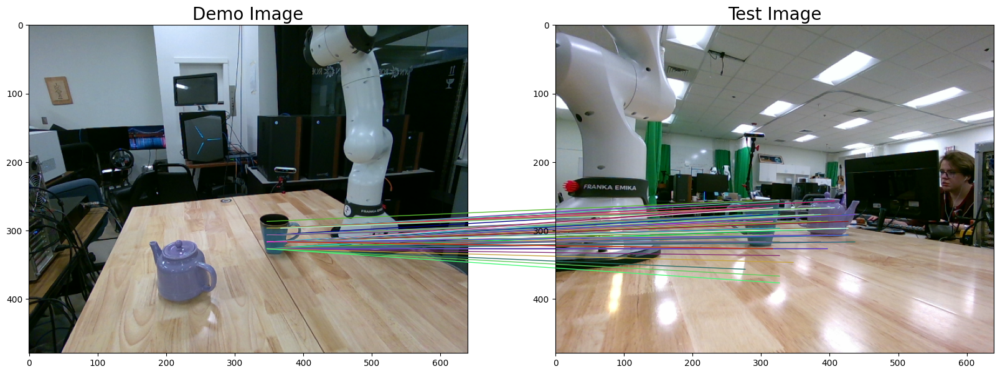

In [108]:
#Visualize matching
test_img_matched_coordinates = []

fig = plt.figure(figsize=(20,10))
ax1 = fig.add_subplot(121)
ax1.title.set_text("Demo Image")
ax1.title.set_fontsize(20) 
ax2 = fig.add_subplot(122)
ax2.title.set_text("Test Image")
ax2.title.set_fontsize(20) 

ax1.imshow(demo_img)
ax2.imshow(test_img)

# print(match2to1)
# print(distances)
matches_info = {}

for part in ['cup', 'handle']:
    matches_info[part] = []
    for test_feature_idx, (dist, demo_feature_idx) in enumerate(zip(distances[part], match2to1[part])):
      demo_feature_idx = np.nonzero(resized_demo_masks[part])[0][demo_feature_idx]
      row, col = dm.idx_to_source_position(demo_feature_idx, demo_image_grid_size, demo_image_resize_scale)
      xy_on_demo_image = (col.item(), row.item())
      if dist > 50: continue
      if not mask_masks[part][0][int(row), int(col)]: continue # skip if feature we watch to visualize matching is not in the demo image mask

      row, col = dm.idx_to_source_position(test_feature_idx, test_image_grid_size, test_image_resize_scale)
      xy_on_test_image = (col, row)
      test_img_matched_coordinates.append(xy_on_test_image)

      # if np.random.rand() > 0.05: continue # sparsely draw so that we can see the lines...

      matches_info[part].append({"Demo_feature_idx": demo_feature_idx.item(), 
                           "Demo_coord": xy_on_demo_image, 
                           "Test_feature_idx": test_feature_idx, 
                           "Test_coord": xy_on_test_image, 
                           "Distance": dist.item()})

      con = ConnectionPatch(xyA=xy_on_test_image, xyB=xy_on_demo_image, coordsA="data", coordsB="data",
                            axesA=ax2, axesB=ax1, color=np.random.rand(3,))
      ax2.add_artist(con)

In [109]:
#sort matches_info by distance
matches_info['handle'] = sorted(matches_info['handle'], key=lambda x: x["Distance"])

#get top k matched features and coordinates
k = 10
top_k_matches = matches_info['handle'][:k]
top_k_demo_coords = np.asarray([match["Demo_coord"] for match in top_k_matches])
top_k_test_coords = np.asarray([match["Test_coord"] for match in top_k_matches])


[[377. 317.]
 [377. 317.]
 [377. 317.]
 [377. 317.]
 [377. 317.]
 [377. 317.]
 [377. 317.]
 [377. 317.]
 [377. 317.]
 [377. 317.]]


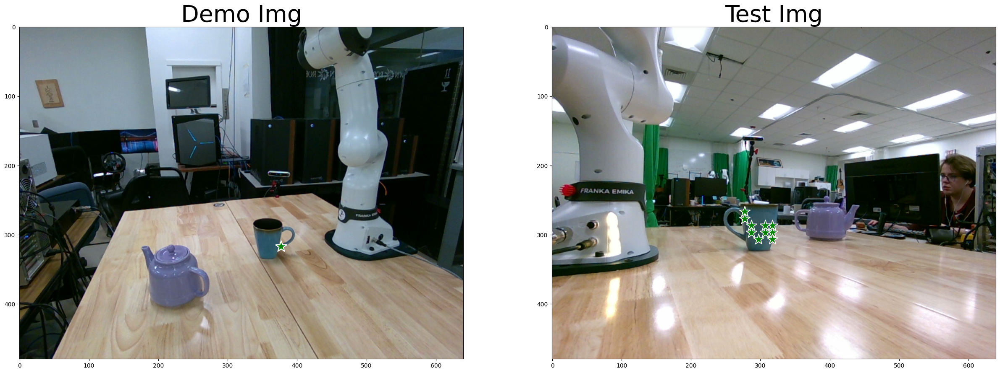

In [110]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30,40))
ax1.imshow(demo_img)
ax1.title.set_text(f"Demo Img")
ax1.title.set_fontsize(40) 
print(top_k_demo_coords)
show_points(top_k_demo_coords, np.ones(top_k_demo_coords.shape[0]), ax1)

ax2.imshow(test_img)
ax2.title.set_text(f"Test Img")
ax2.title.set_fontsize(40) 
show_points(top_k_test_coords, np.ones(top_k_test_coords.shape[0]), ax2)
